# Taller 1. Ciencia de datos MINE-4101
- Nombres: Juan Carlos Cepeda y Jose Daniel Molano
- Sector economico: hotelería
- Problema a resolver: ayudar a cadenas de hoteles a optimizar sus estrategias de ocupación.

## Carga de datos y primera visual de los datos

In [55]:
%pip install ydata-profiling
%matplotlib inline

# Importar librerías
import matplotlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, shapiro, mannwhitneyu, chi2_contingency


Note: you may need to restart the kernel to use updated packages.


In [56]:
# Ruta al archivo (ajusta NOMBRE_DE_TU_CARPETA y el archivo CSV)
ruta = 'data/hotel.csv'

# Leer el CSV
df = pd.read_csv(ruta)

# Revisar el dataframe
print(df.shape)      # Tamaño (filas, columnas)
print(df.columns)    # Nombres de columnas
print(df.head())     # Primeras 5 filas

(58895, 33)
Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'kids'],
      dtype='object')
          hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  \
0  Resort Hotel            0        342             2015.0               July   
1  Resort Hotel            0        737             2015.0               July   
2  Resort Hotel    

/var/folders/gc/6kxjq2ts2yqgg5w9rwlcxv4h0000gn/T/ipykernel_44750/3472689259.py:5: DtypeWarning: Columns (24) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(ruta)


In [57]:
import ydata_profiling

# Generate a thin profile report
profile = df.profile_report(title='Pandas Profiling Report', explorative=True)

# Display the report
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 33/33 [00:00<00:00, 539.45it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [58]:
# Save the report to an HTML file in Google Drive
output_path = 'profile/hotel_profiling_report.html'
profile.to_file(output_path)

print(f"Profiling report saved to: {output_path}")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profiling report saved to: profile/hotel_profiling_report.html


## Análisis y tratamiento inicial de datos
1) Revisar duplicados y eliminarlos
2) Revisar Nulls tanto filas como columnas y tomar decision de borrarlos.
3) Que tipo de datos tenemos actualmente

Vamos a empezar con la eliminación de los duplicados antes de escoger que variables vamos a utilizar. El codigo anterior nos dice que hay un total de 6.5% de registros duplicados, sin embargo, vamos a poner el codigo para contarlos y borrarlos.

In [59]:
# Contar duplicados antes
print("Duplicados antes:", df.duplicated().sum())

# Eliminar duplicados en el mismo df
df.drop_duplicates(inplace=True)

# Verificar después
print("Duplicados después:", df.duplicated().sum())

# Mostrar tamaño final del DataFrame
print(f"El DataFrame ahora tiene {df.shape[0]} registros (filas) y {df.shape[1]} columnas.")

Duplicados antes: 13340
Duplicados después: 0
El DataFrame ahora tiene 45555 registros (filas) y 33 columnas.


Según la grafica de valores nulls en la primera vista, tenemos 3 columnas que poseen la mayoria de nulls que serian kids, company y agent. Vamos a contarlos y decir cuanto porcentaje dentro de esa columna pertenece a esos nulls.

In [60]:
# Análisis de completitud: valores nulos por columna
print("\n Análisis de completitud (valores nulos por columna):")

null_values_by_column = df.isnull().sum()
null_percentage_by_column = (null_values_by_column / len(df)) * 100

completitud = pd.DataFrame({
    'Null Values': null_values_by_column,
    'Null Percentage': null_percentage_by_column
})

# Mostrar ordenado por mayor porcentaje de nulos
print(completitud.sort_values(by='Null Percentage', ascending=False))


 Análisis de completitud (valores nulos por columna):
                                Null Values  Null Percentage
kids                                  45354        99.558775
company                               42773        93.893096
agent                                  7410        16.266052
customer_type                           581         1.275381
arrival_date_year                       579         1.270991
required_car_parking_spaces             579         1.270991
reservation_status                      577         1.266601
country                                 448         0.983427
children                                  4         0.008781
days_in_waiting_list                      1         0.002195
adr                                       1         0.002195
total_of_special_requests                 1         0.002195
reservation_status_date                   1         0.002195
previous_bookings_not_canceled            0         0.000000
deposit_type                  

Como podemos observar, tanto company como kids por tantos nulls, no nos convendría utilizarlos para un analisis posterior, asi que vamos a eliminarlas.

In [61]:
# Eliminar columnas 'kids' y 'company'
df.drop(columns=['kids', 'company'], inplace=True)

# Confirmar que ya no están
print("Columnas actuales:", df.columns.tolist())

Columnas actuales: ['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'agent', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date']


Ahora vamos a ver los nulls a nivel de fila con el fin de encontrar las filas con demasiados valores faltantes

In [62]:
# Análisis de completitud: valores nulos por fila
print("\n Análisis de completitud (valores nulos por fila):")

null_values_by_row = df.isnull().sum(axis=1)
null_percentage_by_row = (null_values_by_row / df.shape[1]) * 100

completitud_row = pd.DataFrame({
    'Null Values': null_values_by_row,
    'Null Percentage': null_percentage_by_row
})

# Distribución de filas según porcentaje de nulos (en rangos de 10%)
print("\n Distribución de filas según % de valores nulos:")
print(completitud_row['Null Percentage'].value_counts(bins=10, sort=False))


 Análisis de completitud (valores nulos por fila):

 Distribución de filas según % de valores nulos:
(-0.0236, 2.258]    36127
(2.258, 4.516]       8701
(4.516, 6.774]        704
(6.774, 9.032]          0
(9.032, 11.29]         22
(11.29, 13.548]         0
(13.548, 15.806]        0
(15.806, 18.065]        0
(18.065, 20.323]        0
(20.323, 22.581]        1
Name: count, dtype: int64


Podemos observar que los dos grupos más grandes de registros presentan entre 0%–2.2% y 2.2%–4.5% de valores nulos.
Dado que el dataset cuenta con 33 columnas, esto equivale aproximadamente a 1 o 2 valores nulos por fila.
En este contexto, no es necesario eliminar estas filas completas, ya que la pérdida de información sería mínima.

Por ultimo vamos a observar los tipos de datos y acomodarlos antes de empezar con la exploración de variables

In [63]:
# Revisar tipos de datos de cada columna
print("\n Tipos de datos por columna:")
print(df.dtypes)


 Tipos de datos por columna:
hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                 float64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agen

En estos momentos hacemos una tabla para mirar el comparativo de variables en como esta en el df en estos momentos vs lo que estamos esperando según el diccionario de datos.

| Columna                       | Tipo en df | Tipo esperado (dicc.) | ¿Se convierte?                               | Descripción                        |
| ----------------------------- | ---------- | --------------------- | ----------------------------------------- | ---------------------------------- |
| hotel                         | object     | text                  | OK                                        | H1 = Resort Hotel, H2 = City Hotel |
| is\_canceled                  | int64      | boolean               | OK (se puede pasar a bool)     | Indica si la reserva fue cancelada |
| lead\_time                    | int64      | integer               | OK                                        | Días entre la reserva y la llegada |
| arrival\_date\_year           | float64    | integer               | **Convertir a int**                       | Año de llegada                     |
| arrival\_date\_month          | object     | text                  | OK                                        | Mes de llegada                     |
| arrival\_date\_week\_number   | int64      | integer               | OK                                        | Semana del año de llegada          |
| arrival\_date\_day\_of\_month | int64      | integer               | OK                                        | Día del mes de llegada             |
| stays\_in\_weekend\_nights    | int64      | integer               | OK                                        | Noches de fin de semana            |
| stays\_in\_week\_nights       | int64      | integer               | OK                                        | Noches entre semana                |
| adults                        | int64      | integer               | OK                                        | Número de adultos                  |
| children                      | float64    | integer               | **Convertir a int** | Número de niños                    |
| babies                        | int64      | integer               | OK                                        | Número de bebés                    |
| meal                          | object     | text                  | OK                                        | Tipo de comida                     |
| country                       | object     | text                  | OK                                        | País de origen                     |
| market\_segment               | object     | text                  | OK                                        | Segmento de mercado                |
| distribution\_channel             | object     | text                  | OK                                                   | Canal de distribución de la reserva |
| is\_repeated\_guest               | int64      | boolean               | OK (puede pasar a bool)                              | Indica si el huésped es repetido    |
| previous\_cancellations           | int64      | integer               | OK                                                   | Reservas previas canceladas         |
| previous\_bookings\_not\_canceled | int64      | integer               | OK                                                   | Reservas previas no canceladas      |
| reserved\_room\_type              | object     | text                  | OK                                                   | Tipo de habitación reservada        |
| assigned\_room\_type              | object     | text                  | OK                                                   | Tipo de habitación asignada         |
| booking\_changes                  | int64      | integer               | OK                                                   | Cambios en la reserva               |
| deposit\_type                     | object     | text                  | OK                                                   | Tipo de depósito                    |
| agent                             | float64    | integer               | **Convertir a int** | ID de la agencia de viajes          |
| days\_in\_waiting\_list           | float64    | integer               | **Convertir a int**                                  | Días en lista de espera             |
| customer\_type                    | object     | text                  | OK                                                   | Tipo de cliente                     |
| adr                               | float64    | numeric               | OK                                                   | Tarifa diaria promedio              |
| required\_car\_parking\_spaces    | float64    | integer               | **Convertir a int**                                  | Espacios de parqueo requeridos      |
| total\_of\_special\_requests      | float64    | integer               | **Convertir a int**                                  | Número de solicitudes especiales    |
| reservation\_status               | object     | text                  | OK                                                   | Estado final de la reserva          |
| reservation\_status\_date         | object     | date                  | **Convertir a date**                             | Fecha del estado final              |


Antes de definir el top 5 atributos mas importantes, vamos a dejar las variables que son bool como numerico para ver correlaciones. Las otras variables si las vamos a convertir a la que nos da el diccionario para irnos con una visual estructurada al momento de escoger los atributos.

In [64]:
# Correcciones de tipos de datos según el diccionario y el análisis

# 1. children → entero (pero cuidando nulos)
df["children"] = df["children"].astype("Int64")

# 2. arrival_date_year → entero
df["arrival_date_year"] = df["arrival_date_year"].astype("Int64")

# 3. agent → texto (ID categórico, no operable numéricamente)
df["agent"] = df["agent"].astype(str)

# 4. days_in_waiting_list → entero
df["days_in_waiting_list"] = df["days_in_waiting_list"].astype("Int64")

# 5. required_car_parking_spaces → entero
df["required_car_parking_spaces"] = df["required_car_parking_spaces"].astype("Int64")

# 6. total_of_special_requests → entero
df["total_of_special_requests"] = df["total_of_special_requests"].astype("Int64")

# 7. reservation_status_date → convertir a solo fecha
df["reservation_status_date"] = pd.to_datetime(
    df["reservation_status_date"], format="%Y-%m-%d"
).dt.date

# Verificación rápida
print(df.dtypes)
print(df["reservation_status_date"].iloc[0])
print(type(df["reservation_status_date"].iloc[0]))

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   Int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                            Int64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

Ahora que ya tenemos las variables según lo esperado en el diccionario, procedemos a hacer un headmap para observar la correlación de atributos.

# 1- Entendimeinto de los datos

## Selección de los 5 atributos top

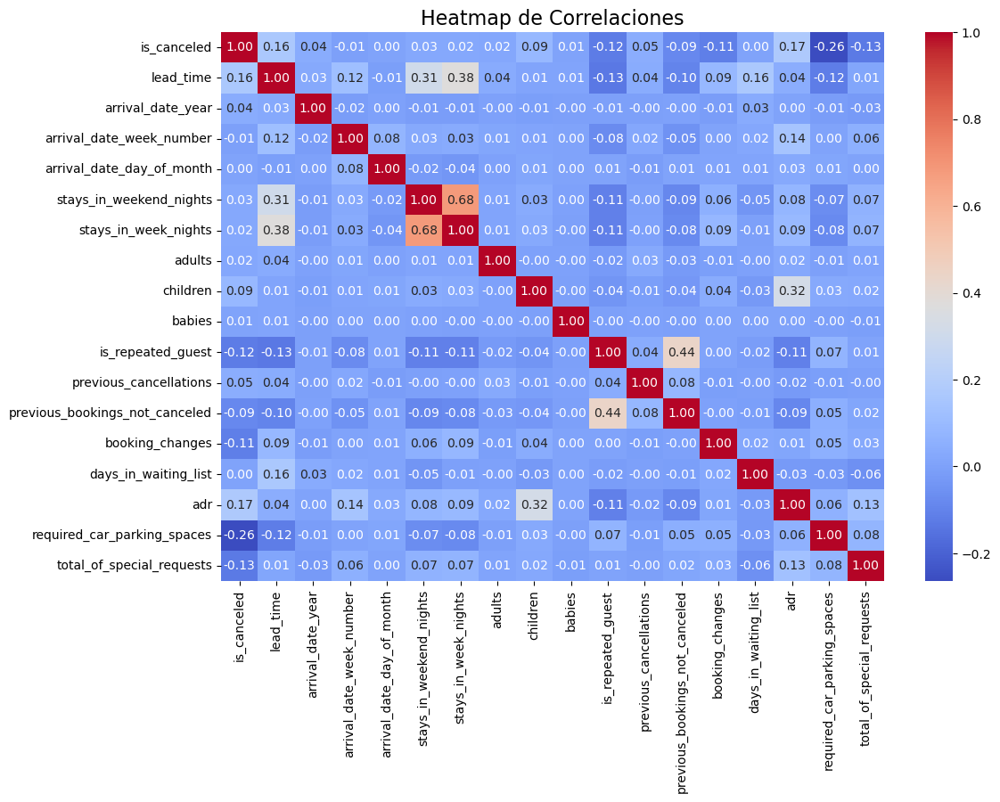

In [65]:
# Calcular correlación solo para variables numéricas
corr = df.corr(numeric_only=True)

# Configurar tamaño del gráfico
plt.figure(figsize=(12, 8))

# Dibujar heatmap
sns.heatmap(corr,
            annot=True,       # mostrar valores en cada celda
            fmt=".2f",        # 2 decimales
            cmap="coolwarm",  # colores azul-rojo
            cbar=True)

plt.title("Heatmap de Correlaciones", fontsize=16)
plt.show()

Debido al heatmap de correlaciones, observamos que entre las variables numéricas no existe una correlación fuerte con la variable objetivo (is_canceled). Incluso aquellas con cierta correlación aceptable no aportan información directamente útil para la problemática de negocio.

Por lo tanto, basándonos en el contexto de la ocupación hotelera, identificamos que las variables que más pueden influir en la cancelación de una reserva son:

- adr (precio),

- reserved_room_type (tipo de habitación reservada),

- market_segment (segmento de mercado),

- lead_time (anticipación de la reserva),

- hotel (tipo de hotel),

Además de la variable objetivo is_canceled, que es indispensable para el análisis.

### Atributo: ard (precio)

Estadísticos de ADR:
count    45554.000000
mean        99.768117
std         63.381885
min         -6.380000
25%         58.000000
50%         85.845000
75%        129.895000
max       5400.000000
Name: adr, dtype: float64
Estadísticos de ADR (depurados):
count    44609.000000
mean       101.355785
std         56.452797
min          0.260000
25%         59.900000
50%         87.000000
75%        130.500000
max        344.670000
Name: adr, dtype: float64


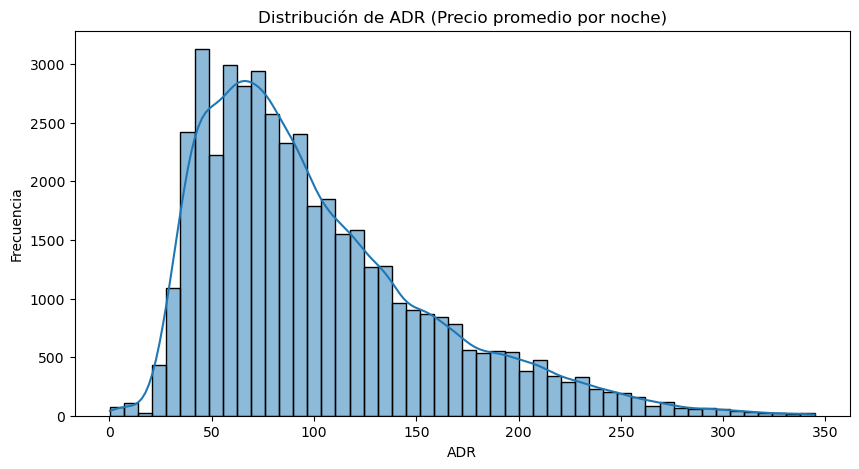

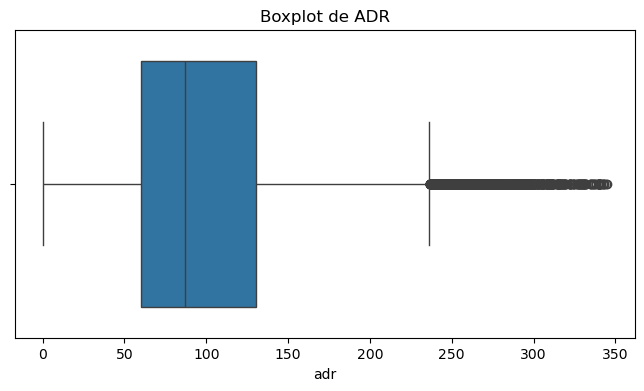

In [66]:
# Estadísticas básicas
print("Estadísticos de ADR:")
print(df["adr"].describe())

# Eliminar puntos a tipicos extremos
min_adr = df['adr'].min()
max_adr = df['adr'].max()
q1 = df['adr'].quantile(0.25)
q3 = df['adr'].quantile(0.75)
iqr = q3 - q1

df = df.loc[df['adr'] >= (q1 - 3 * iqr)]
df = df.loc[df['adr'] <= (q3 + 3 * iqr)]

# Removemos valores inconsistentes
df = df.loc[df['adr'] > 0]

print("Estadísticos de ADR (depurados):")
print(df["adr"].describe())

# Histograma
plt.figure(figsize=(10,5))
sns.histplot(df["adr"], bins=50, kde=True)
plt.title("Distribución de ADR (Precio promedio por noche)")
plt.xlabel("ADR")
plt.ylabel("Frecuencia")
plt.show()

# Boxplot para ver outliers
plt.figure(figsize=(8,4))
sns.boxplot(x=df["adr"])
plt.title("Boxplot de ADR")
plt.show()

### Atributo: reserved_room_type

Frecuencia de tipos de habitación reservada:
reserved_room_type
A    26608
D     8495
E     4688
G     1565
F     1422
C      886
H      574
B      365
L        6
Name: count, dtype: int64


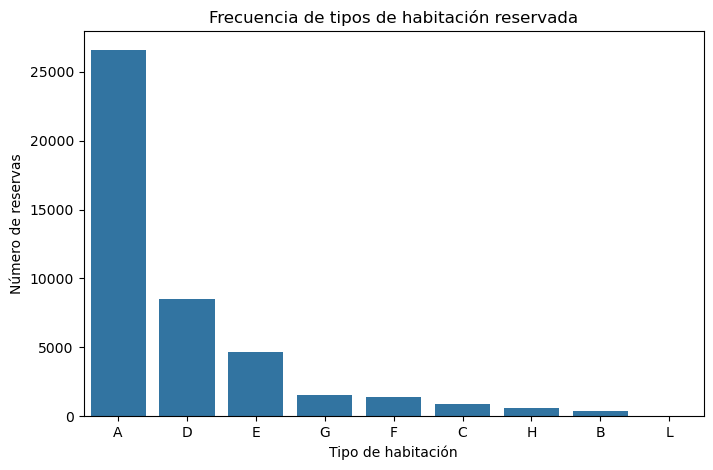

In [67]:
# Conteo de categorías
print("Frecuencia de tipos de habitación reservada:")
print(df["reserved_room_type"].value_counts())

# Gráfico de barras
plt.figure(figsize=(8,5))
sns.countplot(x="reserved_room_type", data=df, order=df["reserved_room_type"].value_counts().index)
plt.title("Frecuencia de tipos de habitación reservada")
plt.xlabel("Tipo de habitación")
plt.ylabel("Número de reservas")
plt.show()

### Atributo: market_segment

Frecuencia de segmentos de mercado:
market_segment
Online TA        23772
Offline TA/TO     8083
Direct            6913
Groups            3635
Corporate         2155
Complementary       32
Aviation            17
Undefined            2
Name: count, dtype: int64


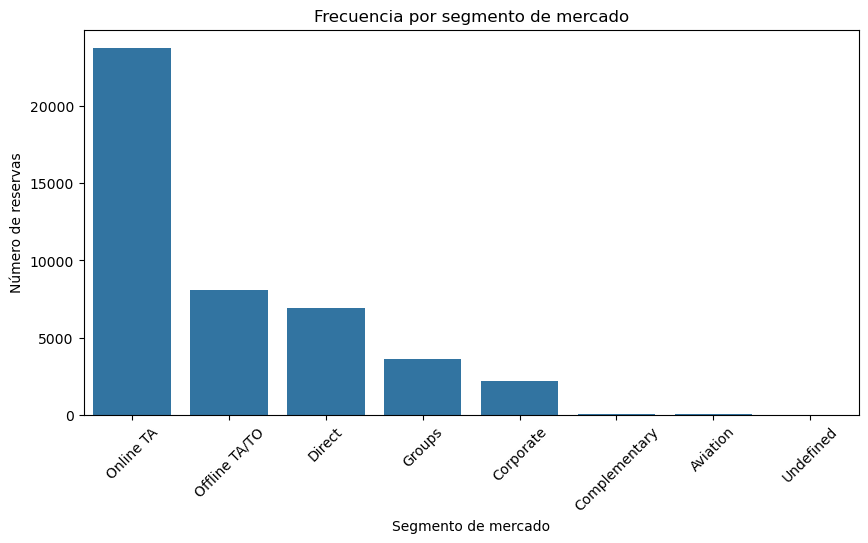

In [68]:
# Conteo de categorías
print("Frecuencia de segmentos de mercado:")
print(df["market_segment"].value_counts())

# Gráfico de barras
plt.figure(figsize=(10,5))
sns.countplot(x="market_segment", data=df, order=df["market_segment"].value_counts().index)
plt.title("Frecuencia por segmento de mercado")
plt.xlabel("Segmento de mercado")
plt.ylabel("Número de reservas")
plt.xticks(rotation=45)
plt.show()

### Atributo: lead_time

Estadísticos de Lead Time:
count    44609.000000
mean        84.761550
std         89.832199
min          0.000000
25%         11.000000
50%         53.000000
75%        135.000000
max        709.000000
Name: lead_time, dtype: float64


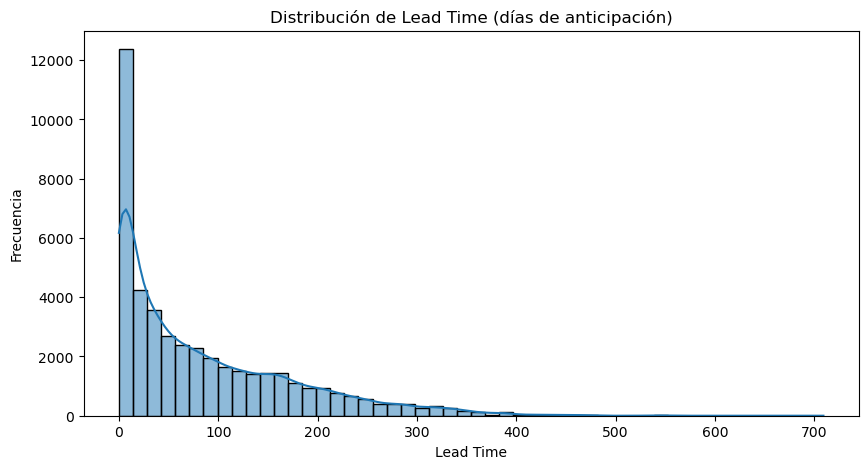

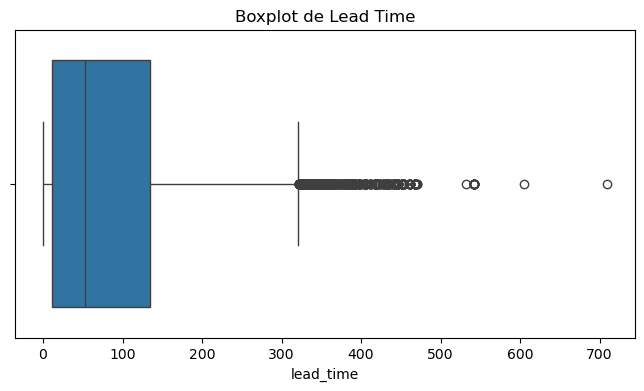

In [69]:
# Estadísticas básicas
print("Estadísticos de Lead Time:")
print(df["lead_time"].describe())

# Histograma
plt.figure(figsize=(10,5))
sns.histplot(df["lead_time"], bins=50, kde=True)
plt.title("Distribución de Lead Time (días de anticipación)")
plt.xlabel("Lead Time")
plt.ylabel("Frecuencia")
plt.show()

# Boxplot
plt.figure(figsize=(8,4))
sns.boxplot(x=df["lead_time"])
plt.title("Boxplot de Lead Time")
plt.show()

### Atributo: hotel

Frecuencia por tipo de hotel:
hotel
Resort Hotel    33800
City Hotel      10809
Name: count, dtype: int64


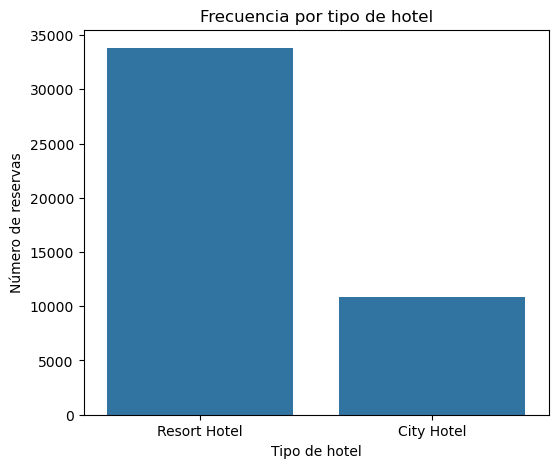

In [70]:
# Conteo de categorías
print("Frecuencia por tipo de hotel:")
print(df["hotel"].value_counts())

# Gráfico de barras
plt.figure(figsize=(6,5))
sns.countplot(x="hotel", data=df, order=df["hotel"].value_counts().index)
plt.title("Frecuencia por tipo de hotel")
plt.xlabel("Tipo de hotel")
plt.ylabel("Número de reservas")
plt.show()

### Atributo clave: is_canceled

El atributo clave para todo lo que vamos a hacer mas adelante es: is_canceled


Conteos:
is_canceled
0    29307
1    15302
Name: count, dtype: int64

Proporciones:
is_canceled
0    65.697505
1    34.302495
Name: proportion, dtype: float64


/var/folders/gc/6kxjq2ts2yqgg5w9rwlcxv4h0000gn/T/ipykernel_44750/1906174455.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x="is_canceled", palette="Set2")


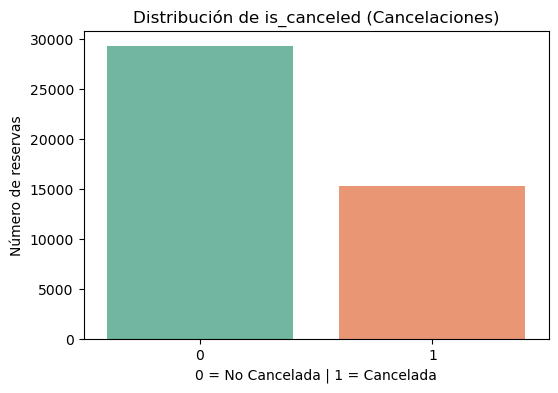

In [71]:
# Conteo absoluto y relativo
print("\nConteos:")
print(df["is_canceled"].value_counts())

print("\nProporciones:")
print(df["is_canceled"].value_counts(normalize=True) * 100)

plt.figure(figsize=(6,4))
sns.countplot(data=df, x="is_canceled", palette="Set2")
plt.title("Distribución de is_canceled (Cancelaciones)")
plt.xlabel("0 = No Cancelada | 1 = Cancelada")
plt.ylabel("Número de reservas")
plt.show()

##Conclusiones de la estadistica univariada

###Hotel

El 75% aproximadamente de los datos se concentran en los hoteles de Resort, mostrando una clara preferencia de los clientes.

Esto sugiere que la estrategia comercial debe considerar la diferencia de perfiles entre quienes prefieren ciudad vs. resort.

###ADR (Average Daily Rate / tarifa promedio)

La distribución de precios es muy asimétrica: la mayoría de tarifas se concentran en un rango bajo, pero existen outliers con precios extremadamente altos.

La presencia de estas tarifas atípicas puede distorsionar la media, por lo que la mediana es un mejor indicador representativo del precio típico.

###Lead Time (tiempo de antelación de la reserva)

Se observa que la mayoría de reservas se hacen con muy poca antelación o, en su defecto, con mucha anticipación (picos extremos).

Esto implica que la planificación de ocupación debe considerar tanto clientes espontáneos como clientes muy previsivos.

###Reserved Room Type (tipo de habitación reservada)

Aunque existen varias categorías, unas pocas concentran la mayoría de reservas.

Esto refleja que hay un producto base (habitación estándar) dominante, mientras que los tipos de habitación menos reservados podrían necesitar revisarse en términos de oferta o marketing.

###Market Segment (segmento de mercado)

El canal “online TA” (agencias de viaje online) domina ampliamente sobre los demás.

Esto sugiere que las estrategias digitales son críticas para la captación de clientes, aunque no se deben descuidar los canales secundarios que podrían crecer.

###is_canceled (variable objetivo)

Aproximadamente un tercio de las reservas terminan en cancelación.

Esto representa una proporción considerable que afecta directamente la ocupación y debe ser el foco principal en los análisis posteriores.

# 2- Estrategia de análisis

Ruta de la estrategia a seguir para reducir cancelaciones y mejorar la ocupación hotelera

El análisis se centrará en caracterizar las reservas a partir de cinco variables clave: tipo de hotel (hotel), tarifa diaria promedio (adr), tiempo de antelación de la reserva (lead_time), tipo de habitación reservada (reserved_room_type) y segmento de mercado (market_segment). Para ello se iniciará con estadísticos descriptivos básicos y visualizaciones univariadas (histogramas, diagramas de cajas y gráficos de barras) que permitirán identificar distribuciones, valores atípicos y patrones iniciales de demanda. Este primer nivel de exploración es fundamental para reconocer tendencias de estacionalidad, rangos de precios más frecuentes y características predominantes en las reservas.

Posteriormente, estas variables se contrastarán con la variable objetivo de cancelación (is_canceled) mediante técnicas estadísticas y visualizaciones multivariadas. Se aplicarán pruebas de chi-cuadrado y Cramér’s V para evaluar la dependencia entre categorías como hotel, segmento de mercado o mes de llegada con la cancelación, mientras que para las variables numéricas como adr y lead_time se usarán pruebas de diferencia de medias (t-test) y análisis de distribución por rangos de precios. Estas pruebas se acompañarán de boxplots segmentados, conteos comparativos y análisis por temporada, lo que permitirá descubrir patrones que expliquen la probabilidad de cancelación y brinden insumos prácticos para diseñar políticas de precios, ajustar estrategias de reserva anticipada y mejorar la ocupación de los hoteles.

# 3- Desarrollo de la estrategia

Analisis multivariado

En esta sección trataremos de relacionar diferentes tipos de variable para tratar de identificar patrones de comportamiento entre multiples variables, tomando como principal referencia el top 5 de metricas identificadas en el analisis univariado.

## 3.1 Identificación de comportamiento de cancelaciones por tipo de hotel

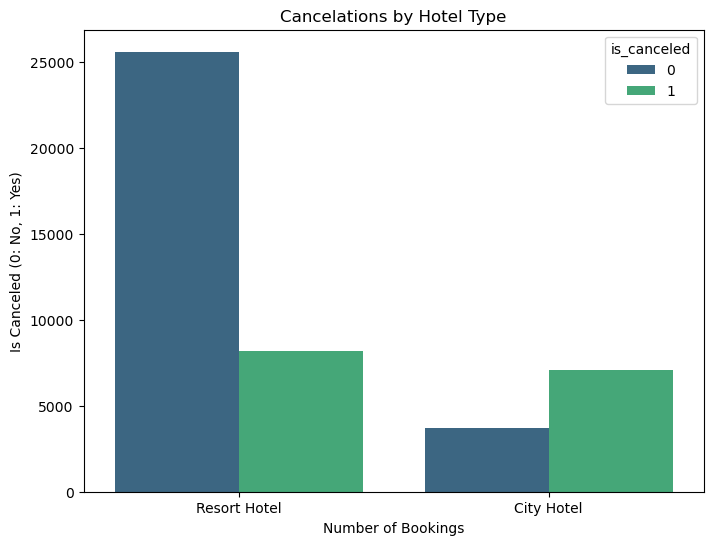

In [72]:
# Generate count plot of is_canceled by hotel type
plt.figure(figsize=(8, 6))
sns.countplot(x='hotel', hue='is_canceled', data=df, palette='viridis')
plt.title('Cancelations by Hotel Type')
plt.xlabel('Number of Bookings')
plt.ylabel('Is Canceled (0: No, 1: Yes)')
plt.show()

Podemos identificar que el comportamiento de cancelaciones varia significativamente por el tipo de hotel.

Levaremos a cabo una prueba de hipotesis para validar este comportamiento.

### 3.1.1 Pruebas de hipotesis

*- - - LET'S ASSUME NORMALITY - - -*

**Step 1.** Define null and alternative hypothesis:

$$
H_0: \text{The variables are not dependent}
$$
$$
H_a: \text{The variables are dependent}
$$

**Step 2.** Define the significance level desired:



In [73]:
alpha_type = 0.01

In [74]:
types = df["hotel"].value_counts().index
#print(types)

contingency_table = pd.crosstab(
    df.loc[df["hotel"].isin(types)]["hotel"],
    df.loc[df["hotel"].isin(types)]["is_canceled"]
)
contingency_table

is_canceled,0,1
hotel,,
City Hotel,3702,7107
Resort Hotel,25605,8195


In [75]:
chi2, pvalue, _, expected = chi2_contingency(contingency_table, correction=False)

In [76]:
n = contingency_table.values.sum()
r, k = contingency_table.shape

phi2 = chi2 / n

phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
r_corr = r - ((r - 1) ** 2) / (n - 1)
k_corr = k - ((k - 1) ** 2) / (n - 1)

cramers_v = np.sqrt(phi2_corr / max(1e-12, min(r_corr - 1, k_corr - 1))) # Cramér's V, bias corrected

In [77]:
print(f"chi-square: {chi2:.4f}")
print(f"p-value:    {pvalue:.4g}")

print(f"Cramér's V: {cramers_v:.3f}")

chi-square: 6260.5168
p-value:    0
Cramér's V: 0.375


In [78]:
if pvalue <= alpha_type:
    print("REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between Hotel Type and if the reserve is canceled or not.")
else:
    print("FAIL TO REJECT THE NULL HYPOTHESIS: There's no statistically significant dependency between Hotel Type and if the reserve is canceled or not.")

REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between Hotel Type and if the reserve is canceled or not.


In [79]:
reference = [0.1, 0.3, 0.5]
magnitude = min(reference, key=lambda r: abs(r - cramers_v))

match magnitude:
    case 0.1:
        print("THE EFFECT SIZE IS SMALL.")
    case 0.3:
        print("THE EFFECT SIZE IS MODERATE.")
    case 0.5:
        print("THE EFFECT SIZE IS LARGE.")

THE EFFECT SIZE IS MODERATE.


### 3.1.1 Resultados de la prueba de hipotesis y conclusión

El **p-value de 0.0000** es menor que el nivel de **significancia (alpha) de 0.01** que se definío. Esto significa que rechazamos la hipótesis nula. **Hay una dependencia estadísticamente significativa entre el tipo de hotel (hotel) y si la reserva es cancelada o no** (is_canceled). En otras palabras, el tipo de hotel sí influye en la probabilidad de que una reserva sea cancelada.

El **Cramér's V de 0.371** indica el tamaño del efecto de esta dependencia. Un valor de 0.3 se considera un tamaño de efecto moderado. Esto significa que **la relación entre el tipo de hotel y las cancelaciones es relevante y no solo una coincidencia menor**. La diferencia en las tasas de cancelación entre los hoteles Resort y City es significativa y tiene un impacto práctico.

**En resumen, la prueba confirma lo que se observó en el gráfico: el tipo de hotel es un factor importante a considerar al analizar las cancelaciones. Cuando el tipo de reserva es Resort la posibilidad de cancelación es baja, en contraste que la si la reserva es de un hotel city la posibilidad de la cancelación es muy alta.**

## 3.2 Distribución de cancelaciones por mes de reserva

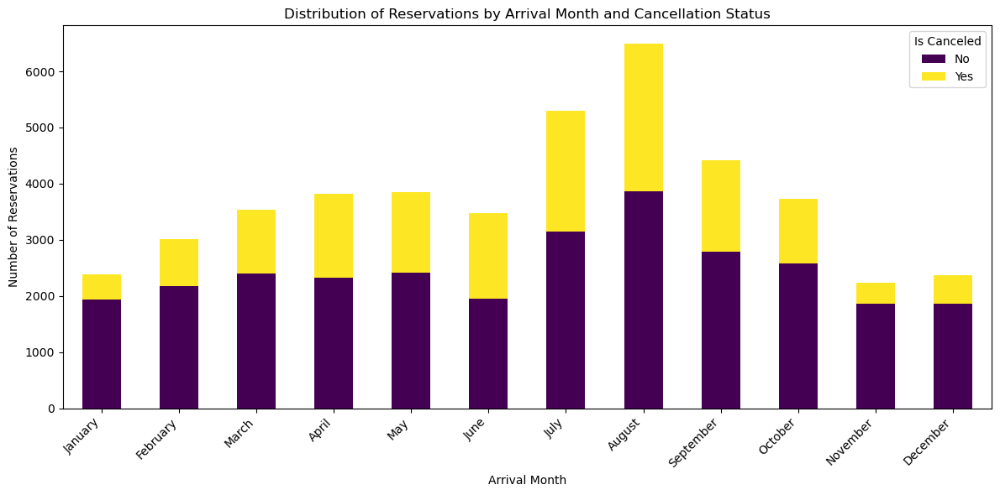

In [80]:
# Group by arrival month and is_canceled, then unstack for plotting
monthly_cancellations = df.groupby(['arrival_date_month', 'is_canceled']).size().unstack()

# Define the order of months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Reindex the dataframe to ensure correct month order
monthly_cancellations = monthly_cancellations.reindex(month_order)

# Plot the stacked bar chart
monthly_cancellations.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')

plt.title('Distribution of Reservations by Arrival Month and Cancellation Status')
plt.xlabel('Arrival Month')
plt.ylabel('Number of Reservations')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Is Canceled', labels=['No', 'Yes'])
plt.tight_layout()
plt.show()

### 3.2.1 Pruebas de hipotesis

*- - - LET'S ASSUME NORMALITY - - -*

**Step 1.** Define null and alternative hypothesis:

$$
H_0: \text{The variables are not dependent}
$$
$$
H_a: \text{The variables are dependent}
$$

**Step 2.** Define the significance level desired:


In [81]:
alpha_month = 0.01

**Step 3 and 4.** Choose the appropriate test, calculate the statistic, p-value, *CI*, and effect size:

In [82]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

contingency_month_table = pd.crosstab(
    df.loc[df["arrival_date_month"].isin(month_order)]["arrival_date_month"],
    df.loc[df["arrival_date_month"].isin(month_order)]["is_canceled"]
)
contingency_month_table = contingency_month_table.reindex(month_order)

contingency_month_table

is_canceled,0,1
arrival_date_month,,
January,1933,454
February,2181,829
March,2395,1144
April,2329,1487
May,2413,1434
June,1946,1527
July,3149,2142
August,3868,2625
September,2791,1630


In [83]:
chi2, pvalue, _, expected = chi2_contingency(contingency_month_table, correction=False)

n = contingency_month_table.values.sum()
r, k = contingency_month_table.shape

phi2 = chi2 / n

phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
r_corr = r - ((r - 1) ** 2) / (n - 1)
k_corr = k - ((k - 1) ** 2) / (n - 1)

cramers_v = np.sqrt(phi2_corr / max(1e-12, min(r_corr - 1, k_corr - 1))) # Cramér's V, bias corrected

print(f"chi-square: {chi2:.4f}")
print(f"p-value:    {pvalue:.4g}")

print(f"Cramér's V: {cramers_v:.3f}")

chi-square: 1226.2522
p-value:    3.557e-256
Cramér's V: 0.165


In [84]:
if pvalue <= alpha_month:
    print("REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between the month to arrival and if the reserve is canceled or not.")
else:
    print("FAIL TO REJECT THE NULL HYPOTHESIS: There's no statistically significant dependency between the month to arrival and if the reserve is canceled or not.")

REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between the month to arrival and if the reserve is canceled or not.


In [85]:
reference = [0.1, 0.3, 0.5]
magnitude = min(reference, key=lambda r: abs(r - cramers_v))

match magnitude:
    case 0.1:
        print("THE EFFECT SIZE IS SMALL.")
    case 0.3:
        print("THE EFFECT SIZE IS MODERATE.")
    case 0.5:
        print("THE EFFECT SIZE IS LARGE.")

THE EFFECT SIZE IS SMALL.


*NOTA:* Debido a que el efecto es bajo, vamos a introducir del contexto de negocio la temporada, donde clasificaremos acorde al mes del año si es una temporada de ocupación alta, media o baja, basado en las estaciones del hemisferio norte.

In [86]:
# Create a dictionary to map months to seasons
season_map = {
    'January': 'Low',
    'February': 'Low',
    'March': 'Mid',
    'April': 'Mid',
    'May': 'Mid',
    'June': 'High',
    'July': 'High',
    'August': 'High',
    'September': 'Mid',
    'October': 'Mid',
    'November': 'Low',
    'December': 'Low'
}

# Create a DataFrame from the contingency_month_table
contingency_month_df = contingency_month_table.reset_index()

# Add the 'season' column based on the 'arrival_date_month'
contingency_month_df['season'] = contingency_month_df['arrival_date_month'].map(season_map)

# Display the new table with season
print("Tabla de contingencia con temporada:")
display(contingency_month_df)

Tabla de contingencia con temporada:


is_canceled,arrival_date_month,0,1,season
0,January,1933,454,Low
1,February,2181,829,Low
2,March,2395,1144,Mid
3,April,2329,1487,Mid
4,May,2413,1434,Mid
5,June,1946,1527,High
6,July,3149,2142,High
7,August,3868,2625,High
8,September,2791,1630,Mid
9,October,2580,1155,Mid


In [87]:
# Create a new contingency table comparing season and is_canceled
contingency_season_table = contingency_month_df.groupby('season').sum()
contingency_season_table = contingency_season_table.drop(columns=['arrival_date_month'])

# Display the new contingency table for season vs. is_canceled
print("\nTabla de contingencia: Temporada vs. Cancelaciones")
display(contingency_season_table)


Tabla de contingencia: Temporada vs. Cancelaciones


is_canceled,0,1
season,,
High,8963,6294
Low,7836,2158
Mid,12508,6850


In [88]:
chi2, pvalue, _, expected = chi2_contingency(contingency_season_table, correction=False)

n = contingency_season_table.values.sum()
r, k = contingency_season_table.shape

phi2 = chi2 / n

phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
r_corr = r - ((r - 1) ** 2) / (n - 1)
k_corr = k - ((k - 1) ** 2) / (n - 1)

cramers_v = np.sqrt(phi2_corr / max(1e-12, min(r_corr - 1, k_corr - 1))) # Cramér's V, bias corrected

print(f"chi-square: {chi2:.4f}")
print(f"p-value:    {pvalue:.4g}")

print(f"Cramér's V: {cramers_v:.3f}")

chi-square: 1053.5090
p-value:    1.712e-229
Cramér's V: 0.154


In [89]:
if pvalue <= alpha_month:
    print("REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between the season and if the reserve is canceled or not.")
else:
    print("FAIL TO REJECT THE NULL HYPOTHESIS: There's no statistically significant dependency between season and if the reserve is canceled or not.")

REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between the season and if the reserve is canceled or not.


In [90]:
reference = [0.1, 0.3, 0.5]
magnitude = min(reference, key=lambda r: abs(r - cramers_v))

match magnitude:
    case 0.1:
        print("THE EFFECT SIZE IS SMALL.")
    case 0.3:
        print("THE EFFECT SIZE IS MODERATE.")
    case 0.5:
        print("THE EFFECT SIZE IS LARGE.")

THE EFFECT SIZE IS SMALL.


### 3.2.1 Resultados de la prueba de hipotesis y conclusión (Mes de Llegada vs. Cancelaciones)

Los **p-value de 3.557e-256 y 1.712e-229** (números extremadamente pequeños) son mucho menores que el nivel de significancia (alpha) de 0.01 que se definió. Esto significa que **rechazamos la hipótesis nula**. Hay una dependencia estadísticamente significativa entre el mes de llegada y la temporada del año(`arrival_date_month`) y si la reserva es cancelada o no (`is_canceled`). En otras palabras, el mes de llegada o la temporada sí influyen en la probabilidad de que una reserva sea cancelada.

Sin embargo, el **Cramér's V de 0.165 y 0.154** indica el tamaño del efecto de esta dependencia. Un valor de 0.1 se considera un **tamaño de efecto pequeño**. Esto significa que la relación entre el mes de llegada y las cancelaciones es estadísticamente significativa, pero la fuerza de esta relación es relativamente débil en comparación con otras variables que podrían tener un tamaño de efecto moderado o grande.

En resumen, la prueba confirma que hay una relación entre el mes de llegada y las cancelaciones, pero este factor por sí solo tiene un impacto pequeño en la probabilidad de cancelación. Otros factores, como el tipo de hotel que vimos anteriormente con un tamaño de efecto moderado, tienen una influencia más pronunciada en el comportamiento de cancelación.

## 3.3 Influencia del precio vs la cancelación

<Axes: xlabel='is_canceled', ylabel='adr'>

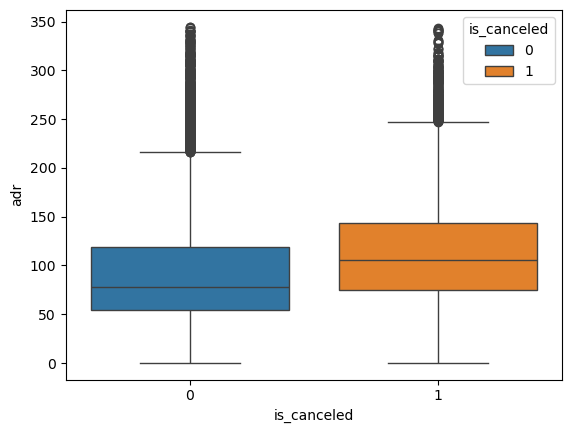

In [91]:

sns.boxplot(data=df, x="is_canceled", y="adr", hue="is_canceled")


### 3.3.1 Pruebas de hipotesis (t-test)

**Step 1.** Define null and alternative hypothesis:

$$
H_0: \mu_1 = \mu_2
$$
$$
H_a: \mu_1 \neq \mu_2
$$  

**Step 2.** Define the significance level desired:

In [92]:
alpha_adr = 0.01

**Step 3 and 4.** Choose the appropriate test, calculate the statistic, p-value, *CI*, and effect size:

In [93]:
a = df[df["is_canceled"] == 0]["adr"]
b = df[df["is_canceled"] == 1]["adr"]

print(a.describe())
print(b.describe())

count    29307.000000
mean        94.044684
std         55.743223
min          0.260000
25%         54.000000
50%         77.760000
75%        119.000000
max        344.670000
Name: adr, dtype: float64
count    15302.000000
mean       115.358298
std         55.146555
min          0.500000
25%         75.000000
50%        106.000000
75%        144.000000
max        343.000000
Name: adr, dtype: float64


In [94]:

result= ttest_ind(a, b, equal_var=False)

ci = result.confidence_interval(alpha_adr) # 99% CI for (mean_a - mean_b)

n1, n2 = len(a), len(b)
m1, m2 = a.mean(), b.mean()
s1, s2 = a.std(), b.std()

sp = np.sqrt(((n1 - 1) * s1 ** 2 + (n2 - 1) * s2 ** 2) / (n1 + n2 - 2)) # Pooled SD
d = (m1 - m2) / sp # Cohen's d

df_pooled = n1 + n2 - 2
J = 1 - 3 / (4 * df_pooled - 1)
g = J * d # Hedges' g (bias-corrected d), particularly important when sample sizes are small

print(f"t-statistic: {result.statistic:.4f}")
print(f"p-value:     {result.pvalue:.4g}")
print(f"IC99%:       [{ci.low:.3f}, {ci.high:.3f}]")

print(f"Cohen's d:  {d:.3f}")
print(f"Hedges' g:  {g:.3f}")

t-statistic: -38.6076
p-value:     0
IC99%:       [-21.321, -21.307]
Cohen's d:  -0.384
Hedges' g:  -0.384


**Step 5.** Interpret, make the decision:

In [95]:
if result.pvalue <= alpha_adr:
    print(f"REJECT THE NULL HYPOTHESIS: The relationship between of the reservation's price and the cancelation rate is statistically significant.")
else:
    print(f"FAIL TO REJECT THE NULL HYPOTHESIS: The relationship between of the reservation's price and the cancelation rate is not statistically significant.")

REJECT THE NULL HYPOTHESIS: The relationship between of the reservation's price and the cancelation rate is statistically significant.


In [96]:
reference = [0.2, 0.5, 0.8]
magnitude = min(reference, key=lambda r: abs(r - g))

match magnitude:
    case 0.2:
        print("THE EFFECT SIZE IS SMALL.")
    case 0.5:
        print("THE EFFECT SIZE IS MODERATE.")
    case 0.8:
        print("THE EFFECT SIZE IS LARGE.")

THE EFFECT SIZE IS SMALL.


### 3.3.1 Resultado de la prueba de hipotesis (t-test) y conclusión
Aunque hay una relación estadísticamente significativa entre el ADR y la cancelación, su impacto práctico es limitado en comparación con otras variables.

Basado en el t-test, hay evidencia estadística sólida de que el precio promedio de la reserva (ADR) es diferente para las reservas canceladas en comparación con las no canceladas. Sin embargo, el tamaño del efecto de esta diferencia es pequeño. Esto sugiere que, si bien el precio tiene una influencia en la probabilidad de cancelación, no es el factor más dominante. Otros atributos que exploraste, como el tipo de hotel, mostraron un tamaño de efecto moderado, lo que indica que pueden ser predictores más fuertes de la cancelación que el precio por sí solo.



### 3.3.2 Prueba de hipotesis (Chi cuadrado)

Vamos a crear categorias en base a rangos de precios, para buscar una relación con la cantidad de cancelaciones en cada uno de estas categorias.

**Step 1.** Define null and alternative hypothesis:

$$
H_0: \text{The variables are not dependent}
$$
$$
H_a: \text{The variables are dependent}
$$

**Step 2.** Define the significance level desired:


In [97]:
alpha_adr_cat = 0.01

**Step 3 and 4.** Choose the appropriate test, calculate the statistic, p-value, *CI*, and effect size:

In [98]:
# Create 5 categories for ADR
df['adr_bin'] = pd.cut(df['adr'], bins=5, labels=["Low", "Medium-low", "Medium", "Medium-high", "High"])

# Group by the new 'adr_bin' and 'is_canceled' and count the occurrences
adr_cancellation_counts = df.groupby(['adr_bin', 'is_canceled'], observed=True).size().unstack(fill_value=0)

# Display the resulting table
print("Distribución de cancelaciones por intervalo de precio (ADR):")
display(adr_cancellation_counts)

Distribución de cancelaciones por intervalo de precio (ADR):


is_canceled,0,1
adr_bin,,
Low,12202,3099
Medium-low,11669,7890
Medium,3796,3131
Medium-high,1397,1027
High,243,155


<Axes: xlabel='adr_bin', ylabel='Count'>

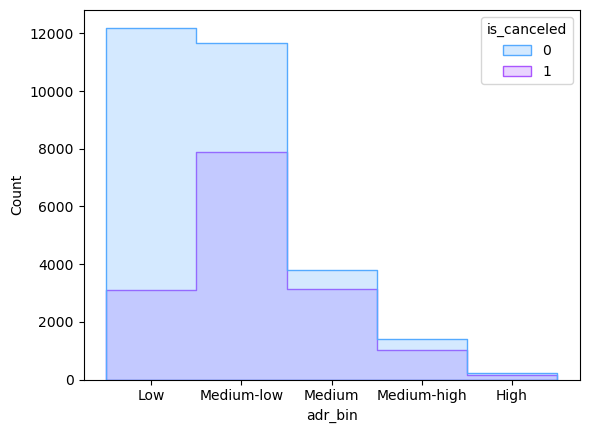

In [99]:
sns.histplot(df, x="adr_bin", hue="is_canceled", element="step", palette="cool")


In [100]:
chi2, pvalue, _, expected = chi2_contingency(adr_cancellation_counts, correction=False)

In [ ]:
n = adr_cancellation_counts.values.sum()
r, k = adr_cancellation_counts.shape

phi2 = chi2 / n
phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
r_corr = r - ((r - 1) ** 2) / (n - 1)
k_corr = k - ((k - 1) ** 2) / (n - 1)

cramers_v = np.sqrt(phi2_corr / max(1e-12, min(r_corr - 1, k_corr - 1))) # Cramér's V, bias corrected

print(f"chi-square: {chi2:.4f}")
print(f"p-value:    {pvalue:.4g}")

print(f"Cramér's V: {cramers_v:.3f}")

chi-square: 2095.1908
p-value:    0
Cramér's V: 0.217


In [102]:
if pvalue <= alpha_adr_cat:
    print("REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between neighborhood and room type.")
else:
    print("FAIL TO REJECT THE NULL HYPOTHESIS: There's no statistically significant dependency between neighborhood and room type.")

REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between neighborhood and room type.


In [103]:
reference = [0.1, 0.3, 0.5]
magnitude = min(reference, key=lambda r: abs(r - cramers_v))

match magnitude:
    case 0.1:
        print("THE EFFECT SIZE IS SMALL.")
    case 0.3:
        print("THE EFFECT SIZE IS MODERATE.")
    case 0.5:
        print("THE EFFECT SIZE IS LARGE.")

THE EFFECT SIZE IS MODERATE.


### 3.3.2 Resultado de la prueba de hipotesis (chi-cuadrado) y conclusión

Basado en la prueba de Chi cuadrado, existe una dependencia estadísticamente significativa entre la categoría de precio (adr_bin) y la probabilidad de cancelación (is_canceled). El tamaño del efecto, indicado por el Cramér's V de 0.217, es moderado. Esto implica que la categorización del precio revela una relación relevante con el comportamiento de cancelación. Podemos inferir que ciertas categorías de precios tienen tasas de cancelación significativamente diferentes a otras.

Este resultado complementa el análisis del t-test, sugiriendo que, si bien la diferencia en el ADR promedio entre reservas canceladas y no canceladas puede ser pequeña, la probabilidad de cancelar sí varía de manera significativa entre los diferentes rangos de precios. Por lo tanto, la estrategia de precios y la segmentación por precio son factores importantes a considerar para optimizar las estrategias de ocupación.

En este caso se puede evidenciar que entre más alto el valor la reserva existe una posibilidad mayor de cancelación princiaplemente entre las categorias Media y Media-Alta

## 3.4 Influencia del tiempo de reserva (lead_time) vs la frecuenacia de cancelación



<Axes: xlabel='lead_time', ylabel='Count'>

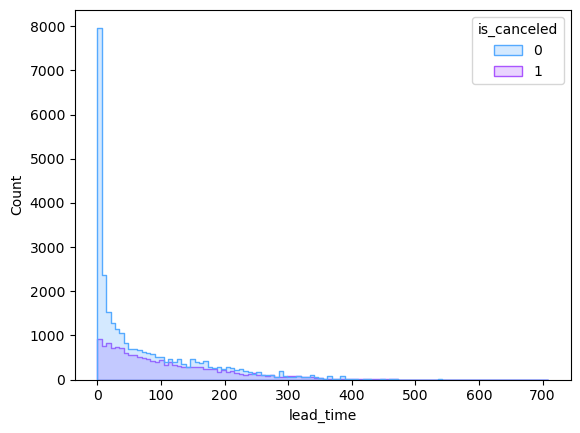

In [ ]:
sns.histplot(data=df, x="lead_time", hue="is_canceled", element="step", palette="cool")

Basado en la gráfica vamos a plantear que existe una correlación entre el tiempo en días transcurridos entre el día que se generó la reserva y la fecha donde inicia la reserva, para esto volveremos a usar Chi cuadrado.

### 3.4.1 Prueba de hipotesis (Chi cuadrado)

Vamos a crear categorias en base a rangos de precios, para buscar una relación con la cantidad de cancelaciones en cada uno de estas categorias.

**Step 1.** Define null and alternative hypothesis:

$$
H_0: \text{The variables are not dependent}
$$
$$
H_a: \text{The variables are dependent}
$$

**Step 2.** Define the significance level desired:

In [ ]:
aplha_lead_time = 0.01

In [110]:
# Create 5 categories for ADR
df['lead_time_bin'] = pd.cut(df['lead_time'], bins=100)

# Group by the new 'adr_bin' and 'is_canceled' and count the occurrences
lead_time_counting = df.groupby(['lead_time_bin', 'is_canceled'], observed=True).size().unstack(fill_value=0)

# Display the resulting table
print("Distribución de cancelaciones por lead_time:")
display(lead_time_counting)

Distribución de cancelaciones por lead_time:


is_canceled,0,1
lead_time_bin,,
"(-0.709, 7.09]",8458,1014
"(7.09, 14.18]",2126,776
"(14.18, 21.27]",1474,809
"(21.27, 28.36]",1249,723
"(28.36, 35.45]",1122,726
...,...,...
"(467.94, 475.03]",9,9
"(531.75, 538.84]",1,0
"(538.84, 545.93]",16,0


In [111]:
chi2, pvalue, _, expected = chi2_contingency(lead_time_counting, correction=False)
n = lead_time_counting.values.sum()
r, k = lead_time_counting.shape

phi2 = chi2 / n
phi2_corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
r_corr = r - ((r - 1) ** 2) / (n - 1)
k_corr = k - ((k - 1) ** 2) / (n - 1)

cramers_v = np.sqrt(phi2_corr / max(1e-12, min(r_corr - 1, k_corr - 1))) # Cramér's V, bias corrected

print(f"chi-square: {chi2:.4f}")
print(f"p-value:    {pvalue:.4g}")

print(f"Cramér's V: {cramers_v:.3f}")

chi-square: 3706.1116
p-value:    0
Cramér's V: 0.286


In [112]:
if pvalue <= alpha_adr_cat:
    print("REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between neighborhood and room type.")
else:
    print("FAIL TO REJECT THE NULL HYPOTHESIS: There's no statistically significant dependency between neighborhood and room type.")

REJECT THE NULL HYPOTHESIS: There's a statistically significant dependency between neighborhood and room type.


In [113]:
reference = [0.1, 0.3, 0.5]
magnitude = min(reference, key=lambda r: abs(r - cramers_v))

match magnitude:
    case 0.1:
        print("THE EFFECT SIZE IS SMALL.")
    case 0.3:
        print("THE EFFECT SIZE IS MODERATE.")
    case 0.5:
        print("THE EFFECT SIZE IS LARGE.")

THE EFFECT SIZE IS MODERATE.


### 3.4.1 Resultado de la prueba de hipotesis (chi-cuadrado) y conclusión

Basado en la prueba de Chi cuadrado, existe una dependencia estadísticamente significativa entre el tiempo desde que se hizo la reserva a la fecha de la reserva (lead_time) y la probabilidad de cancelación (is_canceled). El tamaño del efecto, indicado por el Cramér's V de 0.286, es moderado. Esto implica que el tiempo de antelación revela una relación relevante con el comportamiento de cancelación. Podemos inferir que cuando los tiempos  de anticipación de la reserva incrementa la probabilidad de cancelación significativamente diferentes a otras.
